# Amortized collective inference with NPE

In [7]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math
import pickle
import sbi.utils as utils
import torch
import seaborn as sns
import numpy as np
import sys  
sys.path.insert(1, '../')
from collective_posterior import CollectivePosterior
from simulators import WF

import matplotlib as mpl
plt.rcParams['figure.dpi'] = 600

import warnings
warnings.simplefilter('ignore', Warning)


generation = pd.read_csv('empirical_data/Chuong_116_gens.txt').columns


# Get Collective Posterior
## $P(\theta|X_{1},...X_{n}) = $${{P(\theta)}^{1-n}\Pi_{i}[P(\theta|X_{i})]} \over {\int{{P(\zeta)}^{1-n}}\Pi_{i}[P(\zeta|X_{i})]d\zeta}$

In [8]:
# Prior doesn't have to be identical to network's prior (here it is)
prior_min = np.log10(np.array([1e-2,1e-7,1e-8]))
prior_max = np.log10(np.array([1,1e-2,1e-2]))
prior = utils.BoxUniform(low=torch.tensor(prior_min), 
                         high=torch.tensor(prior_max))
posterior_chuong = pickle.load(open(f'posteriors/posterior_WF_30000_20.pkl', 'rb'))

collective_posteriors = {}
epsilons = {'wt': -300, 'ltr': -150, 'ars': -10, 'all': -10}

lines = ['wt','ltr','ars','all']
for line in lines:
    amortized_posterior = posterior_chuong
    Xs = pd.read_csv(f'empirical_data/{line}.csv', index_col=0) # observations
    Xs = torch.tensor(np.array(Xs), dtype=torch.float32)
    log_C = 1
    op = CollectivePosterior(prior, Xs, amortized_posterior,log_C, epsilon=-150)
    op.get_log_C()
    collective_posteriors[line] = op # to use throughout the notebook
    
rep_colors = {'wt':"black", 'ltr':"#6699cc", 'ars': "#e26d5c", 'all':"#DEBD52", "lauer": "grey"}
label_dict = {'wt': 'Wildtype', 'ltr': 'LTRΔ', 'ars': 'ARSΔ', 'all': 'ALLΔ', 'lauer': 'Lauer'}

# Sample from the collective posteriors

In [13]:
for line in lines:
    samples = collective_posteriors[line].rejection_sample(20)
    print(samples.mean(0))
        # df = pd.DataFrame(samples.numpy())
        # g = sns.PairGrid(df)
        # g.map_upper(sns.scatterplot,color=rep_colors[line])
        # g.map_lower(sns.scatterplot,color=rep_colors[line])
        # g.map_diag(sns.histplot,color=rep_colors[line])


Rejection Sampling: 44it [00:00, 208.68it/s]              


tensor([-0.6395, -5.0936, -4.6680])


Rejection Sampling: 68it [00:00, 257.98it/s]              


tensor([-0.6048, -5.8173, -5.3686])


Rejection Sampling: 68it [00:00, 261.72it/s]              


tensor([-0.7737, -6.0505, -5.9429])


Rejection Sampling: 50it [00:00, 163.40it/s]              

tensor([-0.8452, -5.2486, -5.4707])


# Collective Posterior Validation

## Predictive Checks - Simulate Collective Posterior MAP and compare to empirical observations

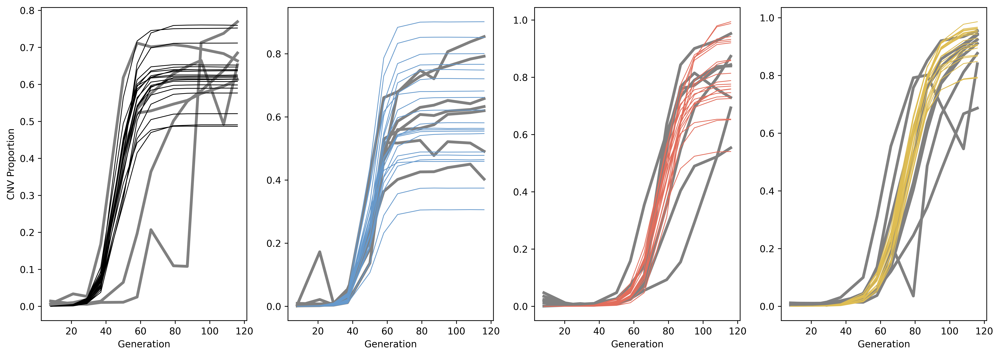

In [17]:
def plot_collective_ppc(ax, line, color):
    cp = collective_posteriors[line]
    samples = cp.samples
    Xs = collective_posteriors[line].Xs
    for i in range(len(Xs)):
        ax.plot(generation.astype('int'),Xs[i], color='grey', lw=3)
    for j in range(len(samples)):
        ax.plot(generation.astype('int'), WF(parameters=samples[j]), color=color, lw=0.8)
    ax.set_xlabel('Generation')

fig, ax = plt.subplots(1,4, figsize=(18,6))
ax[0].set_ylabel('CNV Proportion')
for i in range(len(lines)):
    line = lines[i]
    plot_collective_ppc(ax[i], line, rep_colors[line])

Looks good, we can now look at the posterior shapes

Rejection Sampling: 529it [00:01, 270.48it/s]                         
Rejection Sampling: 536it [00:02, 222.01it/s]                         
Rejection Sampling: 552it [00:02, 247.44it/s]                         
Rejection Sampling: 520it [00:03, 154.37it/s]                         


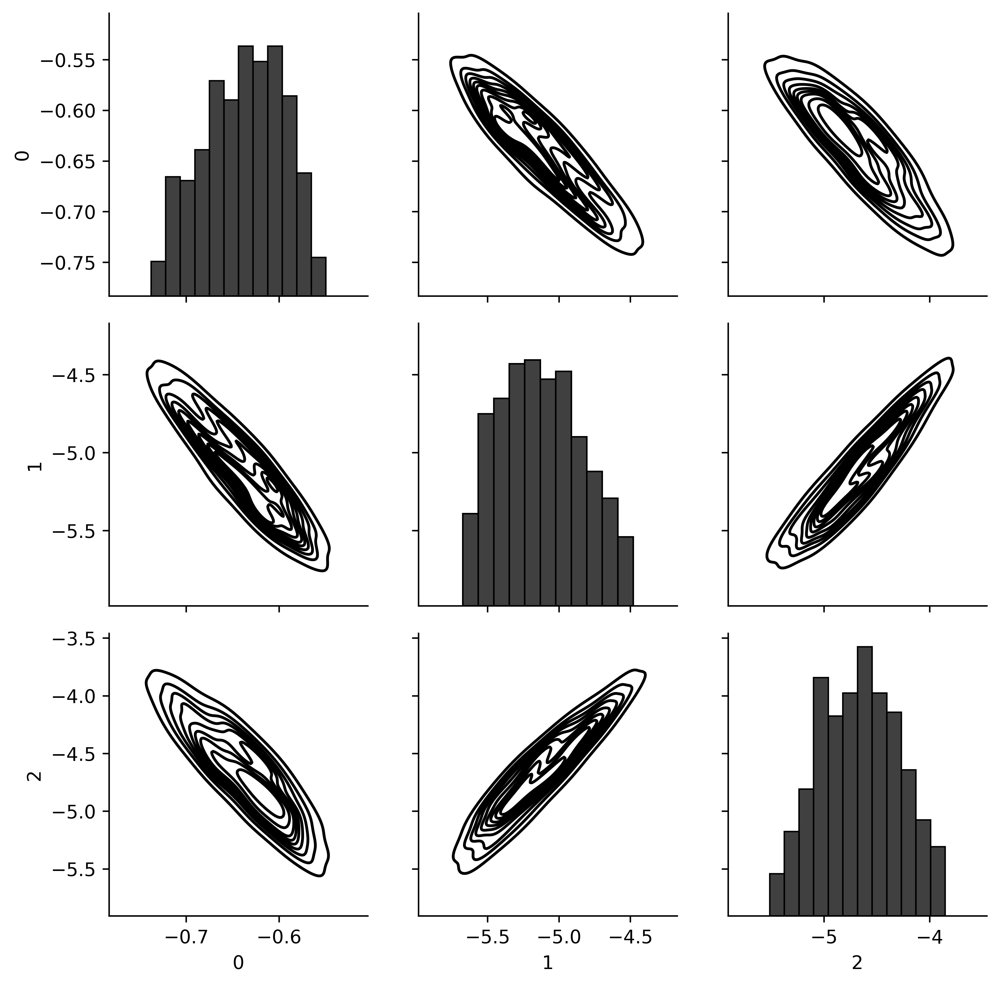

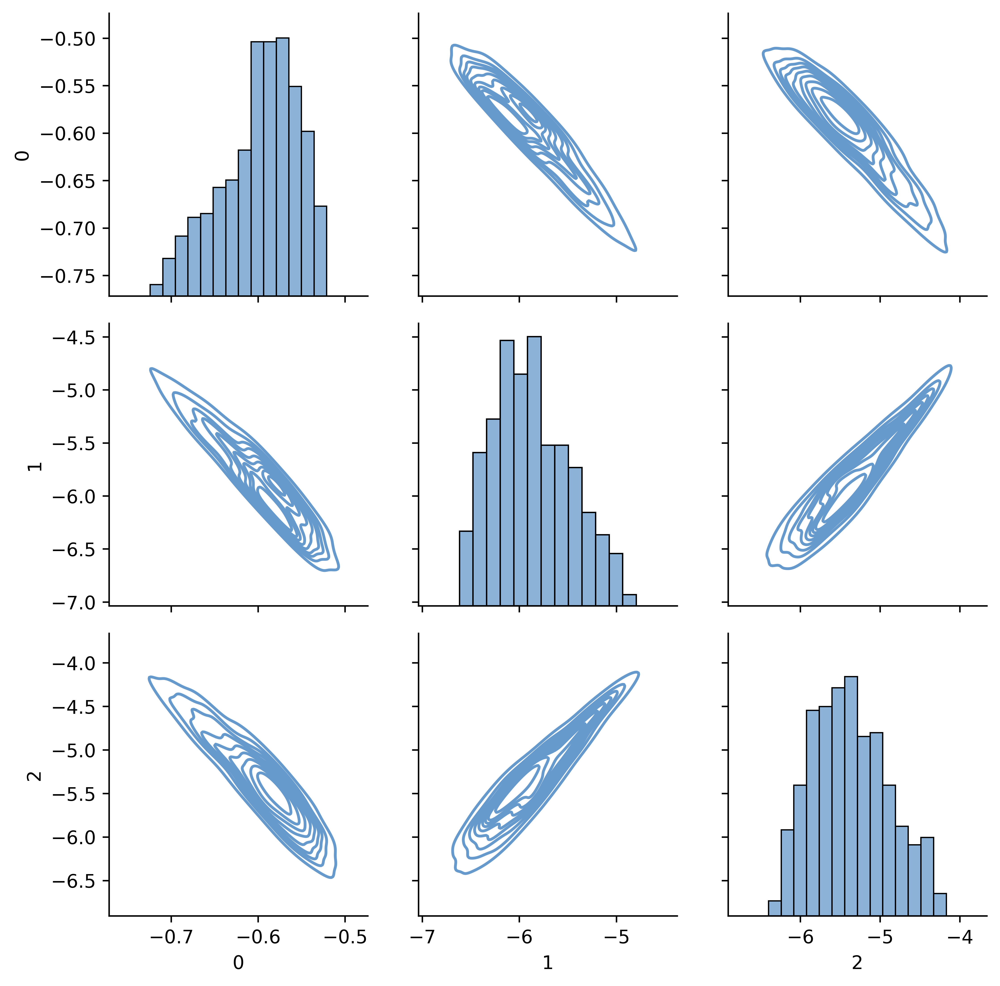

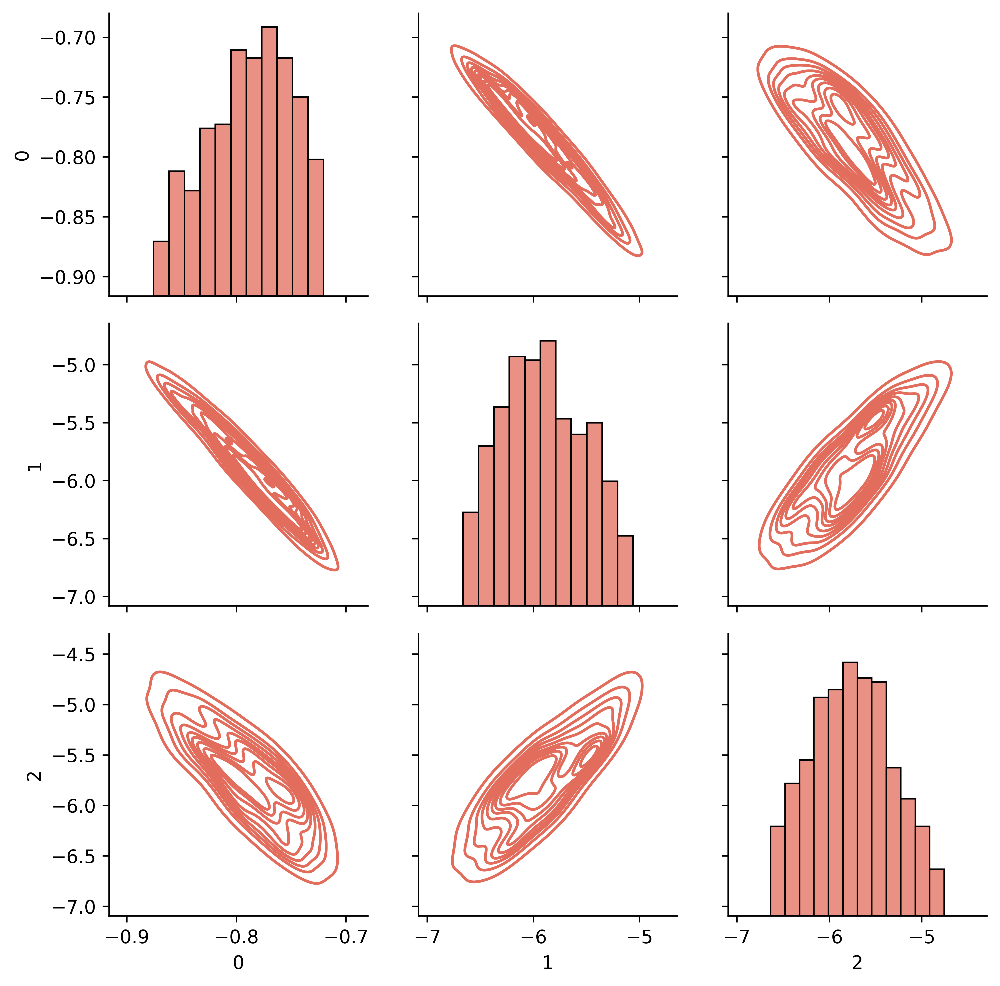

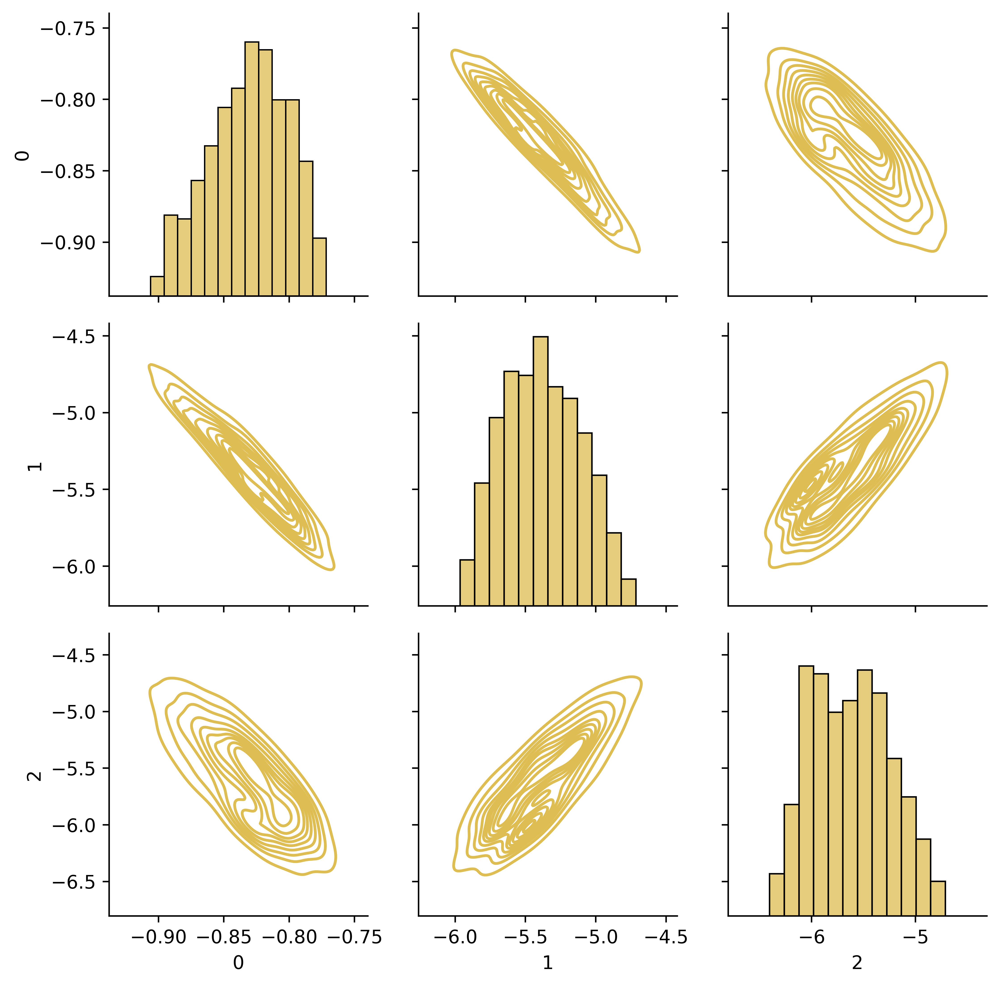

In [11]:
for line in lines:
    samples = collective_posteriors[line].rejection_sample(500)
    df = pd.DataFrame(samples.numpy())
    g = sns.PairGrid(df)
    g.map_upper(sns.kdeplot,color=rep_colors[line])
    g.map_lower(sns.kdeplot,color=rep_colors[line])
    g.map_diag(sns.histplot,color=rep_colors[line])


## Trying with NPE + permutation-invariant embedding

Drawing 50 posterior samples:   0%|          | 0/50 [00:00<?, ?it/s]

tensor([-1.2331, -3.1712, -4.3124])


Drawing 50 posterior samples:   0%|          | 0/50 [00:00<?, ?it/s]

tensor([-1.2956, -2.9354, -3.9624])


Drawing 50 posterior samples:   0%|          | 0/50 [00:00<?, ?it/s]

tensor([-1.0120, -4.4879, -5.8594])


Drawing 50 posterior samples:   0%|          | 0/50 [00:00<?, ?it/s]

tensor([-0.9758, -4.5062, -5.6439])


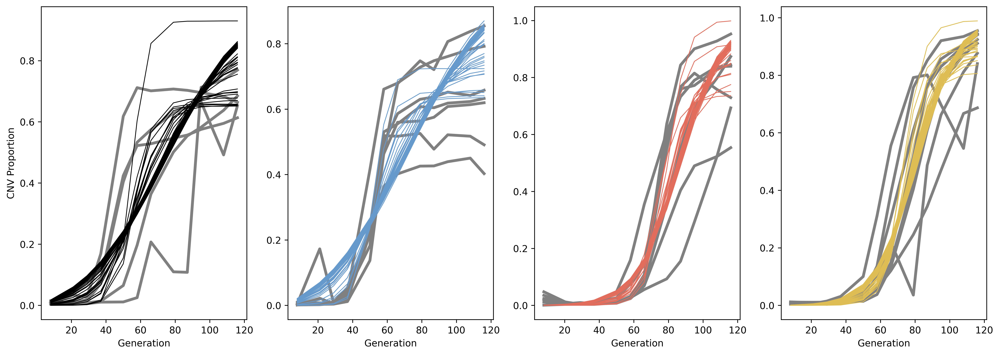

In [18]:
posterior_iid = pickle.load(open('posteriors/posterior_iid_WF_30000_20.pkl', 'rb'))
fig, ax = plt.subplots(1,4, figsize=(18,6))
ax[0].set_ylabel('CNV Proportion')
    
for k in range(len(lines)):
    line = lines[k]
    full_X = torch.empty(10,12)
    X = collective_posteriors[line].Xs
    full_X[:len(X)] = X
    full_X[len(X):] = torch.nan
    samples = posterior_iid.set_default_x(full_X).sample((50,))
    print(samples.mean(0))
    for i in range(len(X)):
        ax[k].plot(generation.astype('int'),X[i], color='grey', lw=3)
    for j in range(len(samples)):
        ax[k].plot(generation.astype('int'), WF(parameters=samples[j]), color=rep_colors[line], lw=0.8)
    ax[k].set_xlabel('Generation')
